In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import os

# Set the root directory
root_dir = '/kaggle/input/plantvillage-dataset'

# List all immediate subdirectories (class names)
class_names = [dirname for dirname in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, dirname))]

# Print the class names
for class_name in class_names:
    print(class_name)

segmented
grayscale
plantvillage dataset
color


In [3]:
from tqdm import tqdm
from pathlib import Path
import pandas as pd

def data(dataset_path):
    images = []
    labels = []
    dataset_path = Path(dataset_path)
    
    for subfolder in tqdm(dataset_path.iterdir(), desc="Processing Subfolders"):
        if subfolder.is_dir():
            for image_file in subfolder.iterdir():
                if image_file.is_file():
                    images.append(str(image_file))
                    labels.append(subfolder.name)
    
    df = pd.DataFrame({'image': images, 'label': labels})
    return df


In [4]:
segmented_path = '/kaggle/input/plantvillage-dataset/segmented'
train_segmented = data(segmented_path)
print(train_segmented.shape)
train_segmented.label.value_counts().to_frame()
num_classes = train_segmented['label'].nunique()
print(f"Number of classes: {num_classes}")

Processing Subfolders: 38it [01:18,  2.06s/it]

(54306, 2)
Number of classes: 38


/tmp/ipykernel_23/906115831.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


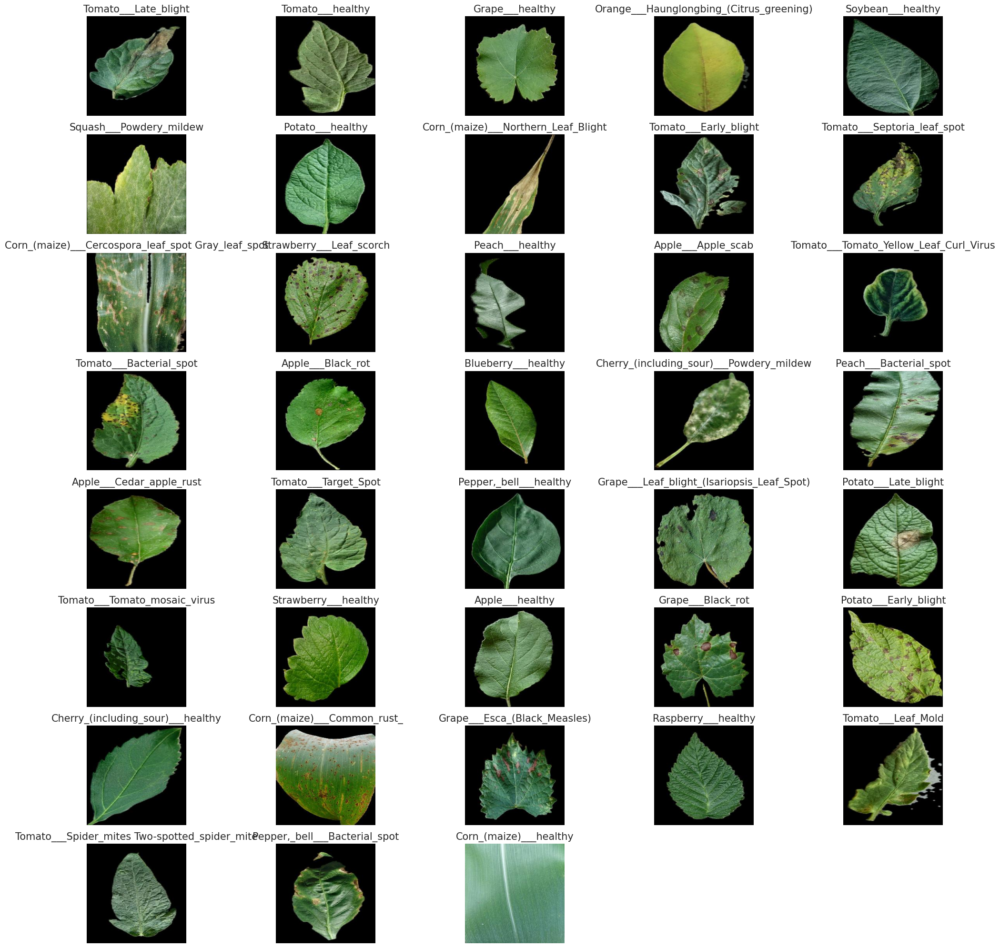

In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List all immediate subdirectories (class names)
class_names = [dirname for dirname in os.listdir(segmented_path) if os.path.isdir(os.path.join(segmented_path, dirname))]

# Change plot style to a lighter background with a clean design
plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(20, 20))

# Loop through each class
for idx, class_name in enumerate(class_names):
    # Get the path to the class directory
    class_dir = os.path.join(segmented_path, class_name)
    
    # List all images in the class directory
    image_files = [file for file in os.listdir(class_dir) if file.endswith(('.png', '.jpg', 'JPG', '.jpeg'))]
    
    if not image_files:
        continue  # Skip if no images are found in the class folder
    
    # Randomly select an image
    random_image = np.random.choice(image_files)
    
    # Load the image
    img_path = os.path.join(class_dir, random_image)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Plot the image
    plt.subplot(len(class_names) // 5 + 1, 5, idx + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(class_name, fontsize=15)

plt.tight_layout()
plt.show()

In [6]:
import gc

# Delete variables
del train_segmented, segmented_path

# Run garbage collection to free memory
gc.collect()


94680

In [7]:
grayscale_path = '/kaggle/input/plantvillage-dataset/grayscale'
train_grayscale = data(grayscale_path)
print(train_grayscale.shape)
train_grayscale.label.value_counts().to_frame()
num_classes = train_grayscale['label'].nunique()
print(f"Number of classes: {num_classes}")

Processing Subfolders: 38it [01:34,  2.48s/it]

(54305, 2)
Number of classes: 38


/tmp/ipykernel_23/908144034.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


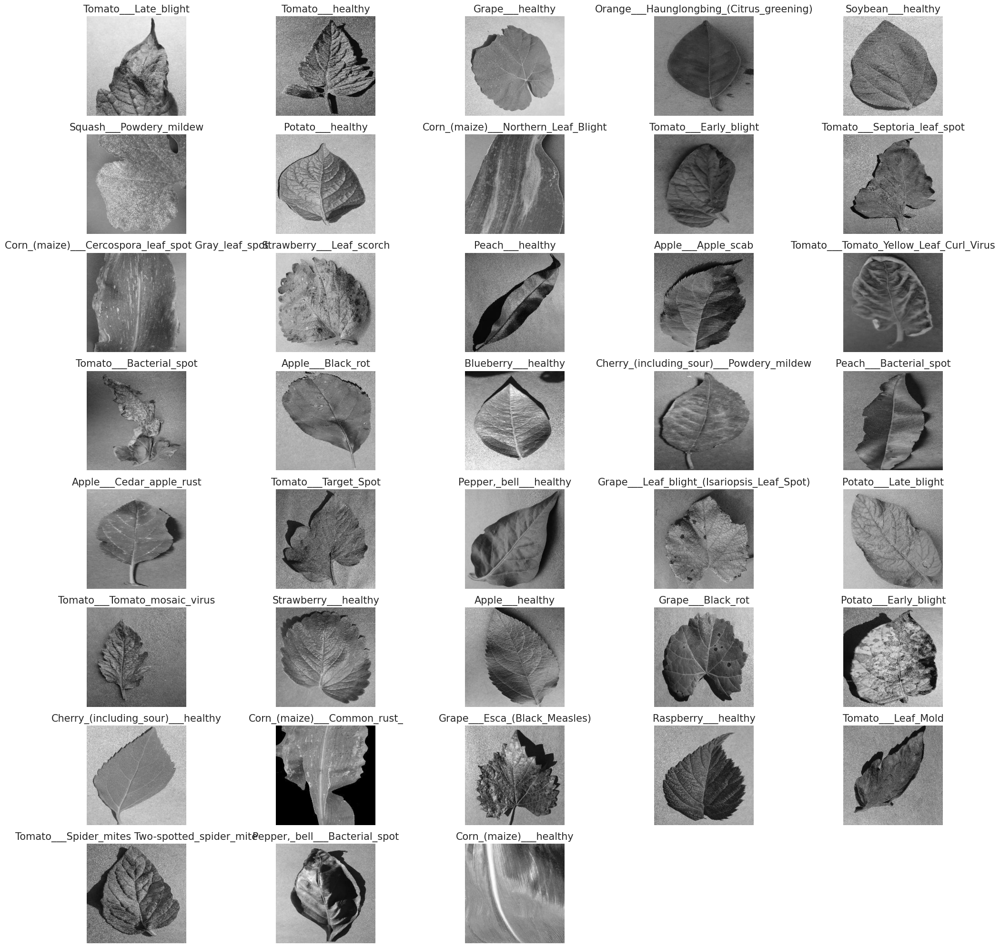

In [8]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List all immediate subdirectories (class names)
class_names = [dirname for dirname in os.listdir(grayscale_path) if os.path.isdir(os.path.join(grayscale_path, dirname))]

# Change plot style to a lighter background with a clean design
plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(20, 20))

# Loop through each class
for idx, class_name in enumerate(class_names):
    # Get the path to the class directory
    class_dir = os.path.join(grayscale_path, class_name)
    
    # List all images in the class directory
    image_files = [file for file in os.listdir(class_dir) if file.endswith(('.png', '.jpg', 'JPG', '.jpeg'))]
    
    if not image_files:
        continue  # Skip if no images are found in the class folder
    
    # Randomly select an image
    random_image = np.random.choice(image_files)
    
    # Load the image
    img_path = os.path.join(class_dir, random_image)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Plot the image
    plt.subplot(len(class_names) // 5 + 1, 5, idx + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(class_name, fontsize=15)

plt.tight_layout()
plt.show()

In [9]:
import gc

# Delete variables
del train_grayscale, grayscale_path

# Run garbage collection to free memory
gc.collect()


95578

In [10]:
color_path = '/kaggle/input/plantvillage-dataset/color'
train_color = data(color_path)
print(train_color.shape)
train_color.label.value_counts().to_frame()
num_classes = train_color['label'].nunique()
print(f"Number of classes: {num_classes}")

Processing Subfolders: 38it [01:20,  2.13s/it]

(54305, 2)
Number of classes: 38


/tmp/ipykernel_23/2366528349.py:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


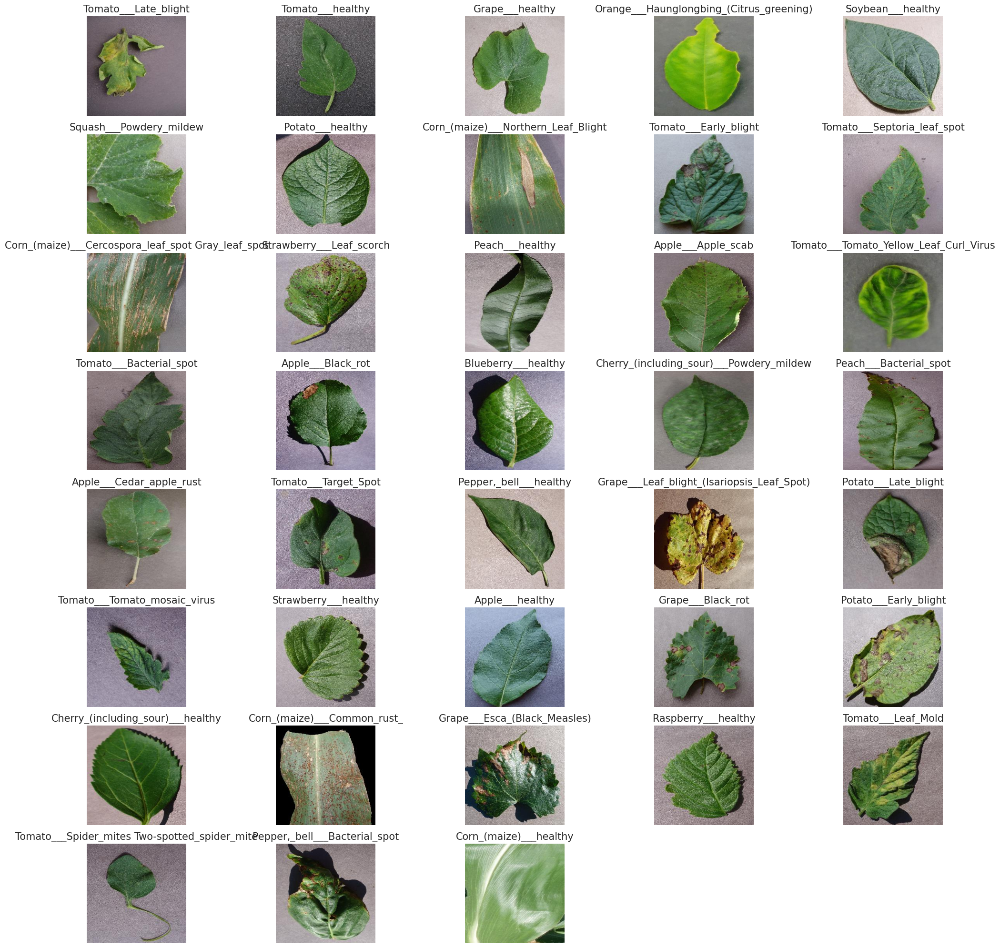

In [11]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List all immediate subdirectories (class names)
class_names = [dirname for dirname in os.listdir(color_path) if os.path.isdir(os.path.join(color_path, dirname))]

plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(20, 20))

# Loop through each class
for idx, class_name in enumerate(class_names):
    # Get the path to the class directory
    class_dir = os.path.join(color_path, class_name)
    
    # List all images in the class directory
    image_files = [file for file in os.listdir(class_dir) if file.endswith(('.png', '.jpg', 'JPG', '.jpeg'))]
    
    if not image_files:
        continue  # Skip if no images are found in the class folder
    
    # Randomly select an image
    random_image = np.random.choice(image_files)
    
    # Load the image
    img_path = os.path.join(class_dir, random_image)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Plot the image
    plt.subplot(len(class_names) // 5 + 1, 5, idx + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(class_name, fontsize=15)

plt.tight_layout()
plt.show()

In [12]:
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [13]:
X_train, X_test1, y_train, y_test1 = train_test_split(train_color['image'], train_color['label'], test_size=0.2, random_state=42,shuffle=True,stratify=train_color['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [14]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image size and batch size
image_size = (224, 224)
batch_size = 32

# Base ImageDataGenerator for rescaling
datagen = ImageDataGenerator(rescale=1./255)

# Train ImageDataGenerator 
train_datagen = ImageDataGenerator(
    rescale=1./255
)

# Create data generators for training, testing, and validation
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    shuffle=True,
    class_mode='categorical'  # Ensure correct class_mode for multi-class problems
)

test_generator = datagen.flow_from_dataframe(
    dataframe=df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical'  # Ensure correct class_mode for multi-class problems
)

val_generator = datagen.flow_from_dataframe(
    dataframe=df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical'  # Ensure correct class_mode for multi-class problems
)


Found 43444 validated image filenames belonging to 38 classes.
Found 5431 validated image filenames belonging to 38 classes.
Found 5430 validated image filenames belonging to 38 classes.


In [15]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.metrics import confusion_matrix, classification_report
from tqdm import tqdm

In [16]:
# ResNet Model Implementation with Dropout
class Residual(tf.keras.Model):  
    """The Residual block of ResNet models."""
    def __init__(self, num_channels, use_1x1conv=False, strides=1, dropout_rate=0.6):
        super().__init__()
        self.conv1 = tf.keras.layers.Conv2D(num_channels, padding='same',
                                            kernel_size=3, strides=strides)
        self.conv2 = tf.keras.layers.Conv2D(num_channels, kernel_size=3,
                                            padding='same')
        self.conv3 = None
        if use_1x1conv:
            self.conv3 = tf.keras.layers.Conv2D(num_channels, kernel_size=1,
                                                strides=strides)
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.bn2 = tf.keras.layers.BatchNormalization()
        self.dropout = tf.keras.layers.Dropout(dropout_rate)

    def call(self, X, training=False):
        Y = tf.keras.activations.relu(self.bn1(self.conv1(X), training=training))
        # If training=True (i.e., when the model is training), the BatchNormalization layer will compute statistics based on the current batch and normalize accordingly.
        # If training=False (i.e., during inference), it will use the running averages of the statistics learned during training.
        Y = self.bn2(self.conv2(Y), training=training)
        if self.conv3 is not None:
            X = self.conv3(X)
        Y += X
        Y = self.dropout(Y, training=training)
        # If training=True (during training), Dropout is applied. This means that random units (neurons) in the tensor Y will be set to zero with the probability defined by the dropout rate (e.g., 0.6). This prevents overfitting by forcing the model to learn more robust features without relying on any single neuron.
        # If training=False (during inference), Dropout is not applied. The output Y remains unchanged because we want the full output (no dropped units) when making predictions.
        return tf.keras.activations.relu(Y)

class ResNet(tf.keras.Model):  
    """General-purpose ResNet implementation."""
    def __init__(self, arch, num_classes=10, dropout_rate=0.5):
        super().__init__()
        # This is the first stage of the ResNet model. It processes the input image through a series of layers to extract low-level features such as edges, corners, and textures.
        self.b1 = tf.keras.models.Sequential([
            tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Activation('relu'),
            tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same')
        ])
        self.residual_blocks = tf.keras.models.Sequential()
        for i, (num_residuals, num_channels) in enumerate(arch):
            self.residual_blocks.add(self._make_block(num_residuals, num_channels, first_block=(i == 0), dropout_rate=dropout_rate))
        self.output_layer = tf.keras.models.Sequential([
            tf.keras.layers.GlobalAvgPool2D(),
            tf.keras.layers.Dense(units=num_classes, activation='softmax')
        ])

    def _make_block(self, num_residuals, num_channels, first_block=False, dropout_rate=0.5):
        blk = tf.keras.models.Sequential()
        for i in range(num_residuals):
            if i == 0 and not first_block:
                blk.add(Residual(num_channels, use_1x1conv=True, strides=2, dropout_rate=dropout_rate))
            else:
                blk.add(Residual(num_channels, dropout_rate=dropout_rate))
        return blk

    def call(self, X, training=False):
        X = self.b1(X, training=training)
        X = self.residual_blocks(X, training=training)
        return self.output_layer(X)

# Define ResNet-18 Architecture
resnet18_arch = [(2, 64), (2, 128), (2, 256), (2, 512)]
model = ResNet(resnet18_arch, num_classes=len(df_train['label'].unique()), dropout_rate=0.3)

In [17]:
# Callbacks: EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
checkpoint_cb = ModelCheckpoint("my_resnet_model.keras", save_best_only=True)
early_stopping_cb = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler_cb = ReduceLROnPlateau(monitor='val_loss', patience=3, factor=0.5, verbose=1)

In [18]:
model.compile(optimizer='adam', loss='categorical_crossentropy', 
              metrics=['accuracy', tf.keras.metrics.AUC()])

In [19]:
# Training the Model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=25,
    callbacks=[checkpoint_cb, early_stopping_cb, lr_scheduler_cb]
)

Epoch 1/25


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1734564187.217687      75 service.cc:145] XLA service 0x79267c0026f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734564187.217749      75 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1734564187.217756      75 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


   1/1358 ━━━━━━━━━━━━━━━━━━━━ 12:57:32 34s/step - accuracy: 0.0312 - auc: 0.5466 - loss: 5.0037

I0000 00:00:1734564208.901908      75 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 344s 228ms/step - accuracy: 0.5529 - auc: 0.9397 - loss: 1.6027 - val_accuracy: 0.3549 - val_auc: 0.8406 - val_loss: 3.1815 - learning_rate: 0.0010
Epoch 2/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 182s 134ms/step - accuracy: 0.8328 - auc: 0.9930 - loss: 0.5229 - val_accuracy: 0.9028 - val_auc: 0.9967 - val_loss: 0.3004 - learning_rate: 0.0010
Epoch 3/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 179s 131ms/step - accuracy: 0.8911 - auc: 0.9967 - loss: 0.3336 - val_accuracy: 0.7372 - val_auc: 0.9708 - val_loss: 0.9716 - learning_rate: 0.0010
Epoch 4/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 178s 131ms/step - accuracy: 0.9182 - auc: 0.9974 - loss: 0.2480 - val_accuracy: 0.8438 - val_auc: 0.9864 - val_loss: 0.5357 - learning_rate: 0.0010
Epoch 5/25
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9327 - auc: 0.9983 - loss: 0.2020
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 178s 131ms/step - accuracy: 0.9327 - auc

/tmp/ipykernel_23/4076214599.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')  # Choose a clean and light background


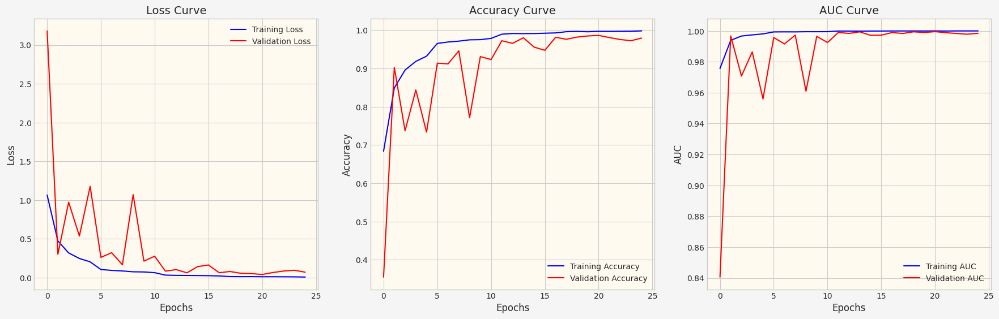

In [20]:
plt.style.use('seaborn-whitegrid')  # Choose a clean and light background
plt.figure(figsize=(18, 6), facecolor='whitesmoke')  # Light figure background

# Loss Curve
plt.subplot(1, 3, 1, facecolor='floralwhite')  # Subplot background
plt.plot(history.history['loss'], 'b-', label='Training Loss')
plt.plot(history.history['val_loss'], 'r-', label='Validation Loss')
plt.title('Loss Curve', fontsize=14)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()

# Accuracy Curve
plt.subplot(1, 3, 2, facecolor='floralwhite')
plt.plot(history.history['accuracy'], 'b-', label='Training Accuracy')
plt.plot(history.history['val_accuracy'], 'r-', label='Validation Accuracy')
plt.title('Accuracy Curve', fontsize=14)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()

# AUC Curve
plt.subplot(1, 3, 3, facecolor='floralwhite')
plt.plot(history.history['auc'], 'b-', label='Training AUC')
plt.plot(history.history['val_auc'], 'r-', label='Validation AUC')
plt.title('AUC Curve', fontsize=14)
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('AUC', fontsize=12)
plt.legend()

# Adjust layout and show the plot
plt.tight_layout(pad=2.0)  # Adds padding between subplots
plt.show()


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


170/170 ━━━━━━━━━━━━━━━━━━━━ 41s 233ms/step


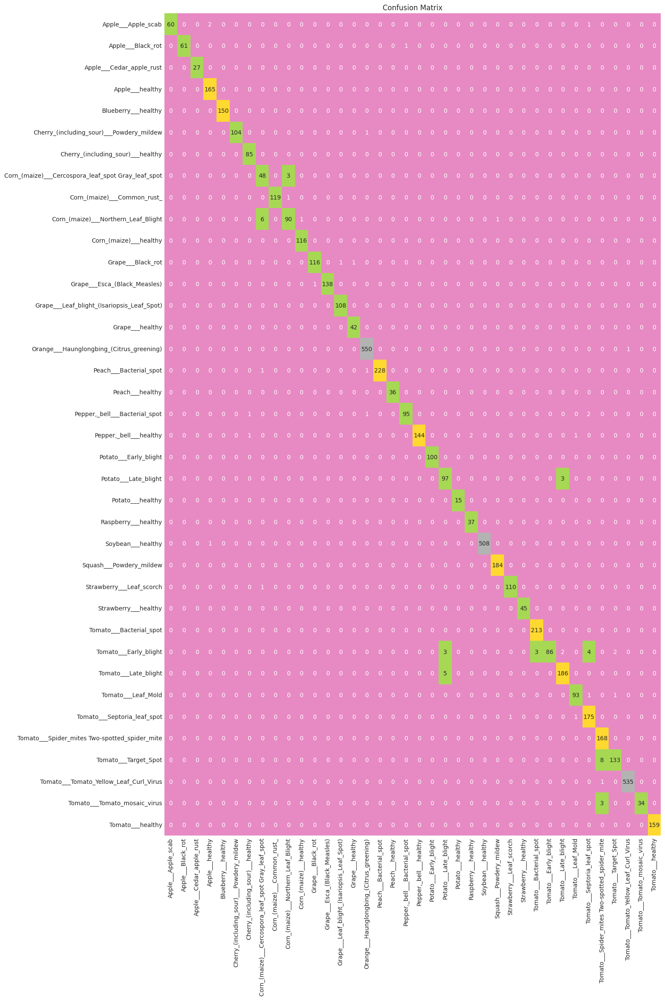

In [21]:
# Confusion Matrix and Classification Report
y_pred = np.argmax(model.predict(test_generator), axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

CM = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(15, 25))
sns.heatmap(CM, fmt='g', center=True, cbar=False, annot=True, cmap='Set2',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.show()

In [22]:
classification_report_str = classification_report(y_true, y_pred, target_names=class_labels)
print('Classification Report:\n', classification_report_str)

Classification Report:
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.95      0.98        63
                                 Apple___Black_rot       1.00      0.98      0.99        62
                          Apple___Cedar_apple_rust       1.00      1.00      1.00        27
                                   Apple___healthy       0.98      1.00      0.99       165
                               Blueberry___healthy       1.00      1.00      1.00       150
          Cherry_(including_sour)___Powdery_mildew       1.00      0.99      1.00       105
                 Cherry_(including_sour)___healthy       0.98      1.00      0.99        85
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.86      0.94      0.90        51
                       Corn_(maize)___Common_rust_       1.00      0.99      1.00       120
               Corn_(maize)___Northern_Leaf_Blight     